
# Setup
---
This part is used to install the last version of some libraries used to connect BigQuery and Collab




In [ ]:
#@title Install Latest Version of Some Packages
!pip install --upgrade google-cloud-bigquery
!pip install --upgrade google-cloud-bigquery-storage
!pip install --upgrade pyarrow
!pip install --upgrade google-cloud-core
!pip install --upgrade chart_studio

     |████████████████████████████████| 174kB 3.3MB/s 
     |████████████████████████████████| 92kB 6.8MB/s 
     |████████████████████████████████| 51kB 6.2MB/s 
     |████████████████████████████████| 92kB 6.7MB/s 
ERROR: google-colab 1.0.0 has requirement google-auth~=1.17.2, but you'll have google-auth 1.20.0 which is incompatible.
ERROR: google-cloud-storage 1.18.1 has requirement google-resumable-media<0.5.0dev,>=0.3.1, but you'll have google-resumable-media 0.7.0 which is incompatible.
  Found existing installation: google-auth 1.17.2
    Uninstalling google-auth-1.17.2:
      Successfully uninstalled google-auth-1.17.2
  Found existing installation: google-api-core 1.16.0
    Uninstalling google-api-core-1.16.0:
      Successfully uninstalled google-api-core-1.16.0
  Found existing installation: google-cloud-core 1.0.3
    Uninstalling google-cloud-core-1.0.3:
      Successfully uninstalled google-cloud-core-1.0.3
  Found existing installation: google-resumable-media 0.4.1
    

     |████████████████████████████████| 143kB 3.3MB/s 


     |████████████████████████████████| 17.2MB 1.2MB/s 
  Found existing installation: pyarrow 0.14.1
    Uninstalling pyarrow-0.14.1:
      Successfully uninstalled pyarrow-0.14.1


Requirement already up-to-date: google-cloud-core in /usr/local/lib/python3.6/dist-packages (1.3.0)
     |████████████████████████████████| 71kB 2.5MB/s 


# Import libraries

---


In [ ]:
#@title Import Python Libraries & Some Other Setup
# Basic Python data science libraries
import pandas as pd
import numpy as np
import scipy.optimize


# Import and setup for plotly in Colab
import chart_studio
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.io as pio

#Other libraries
import matplotlib.pyplot as plt

# Enable extension package to display pandas data frames as interactive tables 
%load_ext google.colab.data_table

# Authentification process

---



In [ ]:
#@title Provide Google Credentials to Colab Runtime (May Require Manually Copy/Pasting Authentication Code)
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


# Definding the project 

---



In [ ]:
#@title Enter GCP/BigQuery Project ID
project_id = 'proj-iit' #@param{type:"string"}

# Packages used for interfacing w/ BigQuery from Python
from google.cloud import bigquery
from google.cloud import bigquery_storage_v1beta1

# Create BigQuery client
bq_client = bigquery.Client(project = project_id)

# Create BigQuery storage client
bq_storage_client = bigquery_storage_v1beta1.BigQueryStorageClient()

# Get time interval to query

---



In [ ]:
begint=(600 + (15 * 86400)+	46800)*1000000
endt=(600 + (16 * 86400)+46800)*1000000

beging=(600 + (15 * 86400)+	43200)*1000000
endg=(600 + (15 * 86400)+43500)*1000000
print("begint="+str(begint))
print("endt="+str(endt))

begint=1343400000000
endt=1429800000000


# 1st Program

---

Get the Data from BigQuery:

In [ ]:
#@title Get google data
%%bigquery googledata --project {project_id}


SELECT start_time,end_time,average_usage,machine_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
WHERE (start_time= 1343400000000 and end_time= 1343700000000) AND machine_id IN (SELECT DISTINCT machine_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
WHERE start_time= 1343400000000 and end_time= 1343700000000
LIMIT 100 )


FailedPrecondition: ignored

In [ ]:
googledata

,start_time,end_time,average_usage,machine_id,cpus,memory
0,1343400000000,1343700000000,"{'cpus': 0.0091400146484375, 'memory': 0.00450...",28084899863,0.009140,0.004509
1,1343400000000,1343700000000,"{'cpus': 0.00017547607421875, 'memory': 0.0009...",226027671110,0.000175,0.000980
2,1343400000000,1343700000000,"{'cpus': 0.009307861328125, 'memory': 0.018280...",344293319222,0.009308,0.018280
3,1343400000000,1343700000000,"{'cpus': 0.009033203125, 'memory': 0.019897460...",231905066917,0.009033,0.019897
4,1343400000000,1343700000000,"{'cpus': 0.008758544921875, 'memory': 0.018066...",91133072,0.008759,0.018066
...,...,...,...,...,...,...
6225,1343400000000,1343700000000,"{'cpus': 0.0003986358642578125, 'memory': 0.00...",36990500397,0.000399,0.001781
6226,1343400000000,1343700000000,"{'cpus': 0.0003414154052734375, 'memory': 0.00...",24745820541,0.000341,0.001728
6227,1343400000000,1343700000000,"{'cpus': 0.03302001953125, 'memory': 0.0264587...",36990500397,0.033020,0.026459
6228,1343400000000,1343700000000,"{'cpus': 0.029144287109375, 'memory': 0.026092...",175283580847,0.029144,0.026093


# Analysis

In [ ]:

nbmax=100
table=googledata["average_usage"]
cpul=[]
meml=[]
for elem in table:
  cpul.append(elem['cpus'])
  meml.append(elem['memory'])
googledata['cpus']=cpul
googledata['memory']=meml
  
googledata.drop(["average_usage"],axis=1)

test1=googledata[["machine_id","cpus","memory"]]
test1b=test1.groupby(["machine_id"]).sum()
test1b=test1b.sort_values(["cpus"])
#Test for CPU
absc=np.linspace(0,1,nbmax)
ords=np.zeros(nbmax)
for elem in test1b["cpus"]:
  for i,elem2 in enumerate(absc):
    if elem>elem2:
      ords[i]+=1
    else:
      break

ords=ords/nbmax

#Test for memory
test1c=test1b.sort_values(["memory"])

absc2=np.linspace(0,1,nbmax)
ords2=np.zeros(nbmax)
for elem in test1c["memory"]:
  for i,elem2 in enumerate(absc):
    if elem>elem2:
      ords2[i]+=1
    else:
      break

ords2=ords2/nbmax
ords2


NameError: ignored

# Print results



<function matplotlib.pyplot.figure>

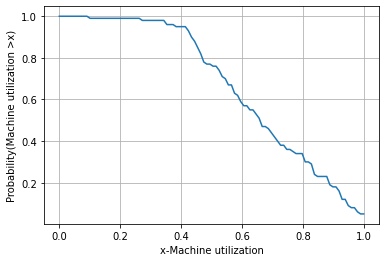

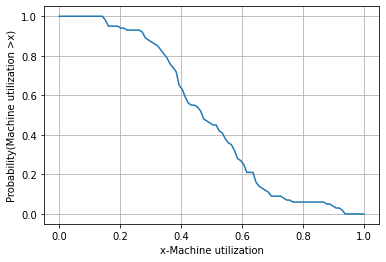

In [ ]:


plt.plot(absc,ords)
plt.xlabel("x-Machine utilization")
plt.ylabel("Probability(Machine utilization >x)")
plt.grid()
plt.figure

plt.figure()
plt.plot(absc,ords2)
plt.xlabel("x-Machine utilization")
plt.ylabel("Probability(Machine utilization >x)")
plt.grid()
plt.figure


# 2nd Program

---

Get the Data from BigQuery:

In [ ]:
#@title Get google data
%%bigquery googledata2 --project {project_id}


SELECT time
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (time between 1296600000000 and 1383000000000) AND type=0

In [ ]:
googledata2

,time
0,1358647322957
1,1306612369659
2,1375526083844
3,1332982652591
4,1362412134772
...,...
31286,1348859333296
31287,1373288246602
31288,1333712493212
31289,1353993728472


# Analysis

In [ ]:
nbmax=100
hours=np.linspace(1296600000000,1383000000000,25)
datal=np.zeros(24)
for i,elem in enumerate(hours):
  for elem2 in googledata2['time']:
    if (elem2>elem) and (elem2<(elem+3600000000)):
      datal[i]+=1 


datal
absc2=np.linspace(0,5000,nbmax)
ords2=np.zeros(nbmax)
for elem in datal:
  for i,elem2 in enumerate(absc2):
    if elem>elem2:
      ords2[i]+=1
    else:
      break

ords2


array([24., 24., 24., 24., 24., 24., 24., 24., 24., 24., 24., 24., 24.,
       24., 24., 24., 24., 24., 24., 24., 24., 24., 23., 22., 17., 12.,
        9.,  6.,  4.,  3.,  2.,  2.,  1.,  1.,  1.,  1.,  1.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

# Print results :

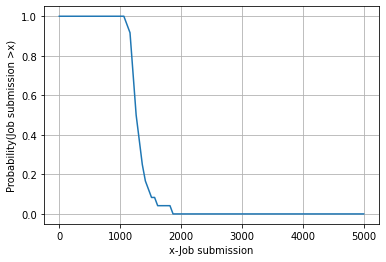

In [ ]:
plt.figure()
plt.plot(absc2,ords2/24)
plt.xlabel("x-Job submission")
plt.ylabel("Probability(Job submission >x)")
plt.grid()


# 3rd Program

---
Get the Data from BigQuery:


In [ ]:
#@title Get google data
%%bigquery googledata3 --project {project_id}

SELECT ANY_VALUE(priority),instance_index,COUNT(DISTINCT(alloc_collection_id))
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_events`
WHERE (time between 1296600000000 and 1383000000000) and collection_type=0
GROUP BY instance_index
LIMIT 10000


In [ ]:
googledata3

,f0_,instance_index,f1_
0,0,5032,1
1,200,238,73
2,200,268,68
3,200,0,1890
4,200,51,166
...,...,...,...
9995,103,47784,0
9996,103,39490,0
9997,103,46553,0
9998,103,33214,0


# Analysis

In [ ]:
nbmax=200
lprod=[]
lbeb=[]
lfree=[]
lmid=[]

for elem in googledata3.values:
  if elem[0]<100:
    lfree.append(elem[2])
  elif elem[0]<120:
    lmid.append(elem[2])
  elif elem[0]<200:
    lprod.append(elem[2])
  else:
    lbeb.append(elem[2])


absc=np.linspace(1,max(googledata3["f1_"]+1),nbmax+1)
ords=np.zeros(nbmax)
for elem in lfree:
  for i,elem2 in enumerate(absc):
    if elem>=elem2:
      ords[i]+=1
    else:
      break

ords2=np.zeros(nbmax)
for elem in lmid:
  for i,elem2 in enumerate(absc):
    if elem>=elem2:
      ords2[i]+=1
    else:
      break

ords3=np.zeros(nbmax)
for elem in lprod:
  for i,elem2 in enumerate(absc):
    if elem>=elem2:
      ords3[i]+=1
    else:
      break

ords4=np.zeros(nbmax)
for elem in lbeb:
  for i,elem2 in enumerate(absc):
    if elem>=elem2:
      ords4[i]+=1
    else:
      break


ords=np.concatenate(([1],ords/sum(ords)))
ords2=np.concatenate(([1],ords2/sum(ords2)))
ords3=np.concatenate(([1],ords3/sum(ords3)))
ords4=np.concatenate(([1],ords4/sum(ords4)))



# Print results

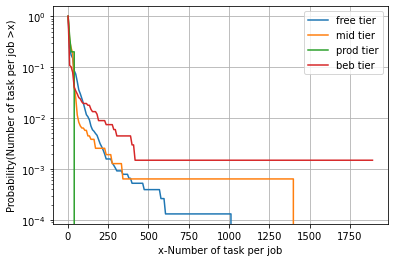

In [ ]:
plt.figure()
plt.semilogy(absc,ords,absc,ords2,absc,ords3,absc,ords4)
plt.xlabel("x-Number of task per job")
plt.ylabel("Probability(Number of task per job >x)")
plt.legend(["free tier","mid tier","prod tier","beb tier"])
plt.grid()


# 4th Program

---

Get the Data from BigQuery:

In [ ]:
#@title Get google data
%%bigquery googledata4 --project {project_id}


SELECT resource_request,priority
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_events`
WHERE (time between 1343400000000 and 1343500000000) 
LIMIT 100000

In [ ]:
googledata4

,resource_request,priority
0,"{'cpus': 0.002376556396484375, 'memory': 0.002...",0.0
1,"{'cpus': 0.002376556396484375, 'memory': 0.018...",0.0
2,"{'cpus': 0.002376556396484375, 'memory': 0.001...",0.0
3,"{'cpus': 0.002376556396484375, 'memory': 0.001...",0.0
4,"{'cpus': 0.0017604827880859375, 'memory': 0.00...",0.0
...,...,...
98069,"{'cpus': 0.016571044921875, 'memory': 0.011825...",101.0
98070,"{'cpus': 0.016571044921875, 'memory': 0.011825...",101.0
98071,"{'cpus': 0.016571044921875, 'memory': 0.011825...",101.0
98072,"{'cpus': 0.016571044921875, 'memory': 0.011825...",101.0


# Analysis

In [ ]:
nbmax=100
googledata4=googledata4.dropna(subset=["resource_request"])
table=googledata4["resource_request"]
cpul=[]
meml=[]

for elem in table:
  cpul.append(elem['cpus'])
  meml.append(elem['memory'])
googledata4['cpus']=cpul
googledata4['memory']=meml
  
googledata4=googledata4.fillna(0)
priol=[]

table=googledata4["priority"]
for elem in table:
  if elem<100:
    priol.append("free")
  elif elem<120:
    priol.append("mid")
  elif elem<200:
    priol.append("prod")
  else:
    priol.append("beb")

googledata4["priol"]=priol

googledata4


test1=googledata4[["priol","cpus","memory"]]
test1b=test1.groupby(["priol"]).sum()
# test1b=test1b.sort_values(["cpus"])
test1b


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,cpus,memory
priol,,
beb,151.771235,42.578686
free,432.793144,267.682114
mid,465.922184,345.422483
prod,0.000000,0.086792


# 5th Program

---



In [ ]:
#@title Get google data
%%bigquery googledata5 --project {project_id}



SELECT start_time,end_time,average_usage,collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
WHERE collection_id IN (SELECT DISTINCT collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
LIMIT 100 )
LIMIT 300000

In [ ]:
googledata5

,start_time,end_time,average_usage,collection_id
0,94155000000,94164000000,"{'cpus': 0.00035953521728515625, 'memory': 0.0...",455967767104
1,94035000000,94164000000,"{'cpus': 0.02337646484375, 'memory': 0.0080413...",455967767104
2,94028000000,94163000000,"{'cpus': 0.01898193359375, 'memory': 0.0074691...",455967767104
3,94028000000,94164000000,"{'cpus': 0.025360107421875, 'memory': 0.008712...",455967767104
4,93900000000,94155000000,"{'cpus': 0.0264892578125, 'memory': 0.00754547...",455967767104
...,...,...,...,...
46849,593823000000,593827000000,"{'cpus': 0.0002593994140625, 'memory': 1.33514...",461440155057
46850,593823000000,593829000000,"{'cpus': 0.0002288818359375, 'memory': 8.58306...",461440155057
46851,593823000000,593827000000,"{'cpus': 0.0, 'memory': 1.621246337890625e-05}",461440155057
46852,593823000000,593826000000,"{'cpus': 0.0, 'memory': 1.1444091796875e-05}",461440155057


In [ ]:
nbmax=20000
nbit=100

table=googledata5["average_usage"]
cpul=[]
meml=[]

for elem in table:
  cpul.append(elem['cpus'])
  meml.append(elem['memory'])
googledata5['cpus']=cpul
googledata5['memory']=meml
googledata5['duree']=googledata5['end_time']-googledata5['start_time']

tablet=googledata5[["duree","collection_id","cpus","memory"]]


tablet["rescpu"]=tablet["cpus"]*1000000/tablet["duree"]
tablet["resmem"]=tablet["memory"]*1000000/tablet["duree"]

tablet=tablet.groupby("collection_id").sum()


datacpu=tablet["rescpu"]

absc=np.logspace(-6,4,nbmax)
ords=np.zeros(nbmax)
for elem in datacpu:
  for i,elem2 in enumerate(absc):
    if elem>elem2:
      ords[i]+=1
    else:
      break


datamem=tablet["resmem"]
ords2=np.zeros(nbmax)
for elem in datamem:
  for i,elem2 in enumerate(absc):
    if elem>elem2:
      ords2[i]+=1
    else:
      break


ords=ords/nbit
ords2=ords2/nbit

ords2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



array([1., 1., 1., ..., 0., 0., 0.])

# Plot figure

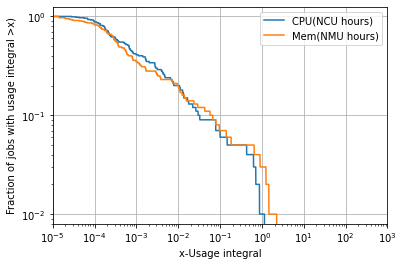

In [ ]:
plt.figure()
plt.loglog(absc,ords,absc,ords2)
plt.xlabel("x-Usage integral")
plt.ylabel("Fraction of jobs with usage integral >x)")
plt.legend(["CPU(NCU hours)","Mem(NMU hours)"])
plt.xlim([10e-6,10e2])
plt.grid()

# 6th Program

---

Get google data

In [ ]:
#@title Get google data
%%bigquery googledata6 --project {project_id}


SELECT type
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (time between 1296600000000 and 1383000000000) AND (type=6 or type=5)

In [ ]:
googledata6

,type
0,5
1,5
2,5
3,5
4,5
...,...
31031,6
31032,6
31033,6
31034,6


In [ ]:
count=0
for elem in googledata6["type"]:
  if elem==5:
    count+=1
count/np.size(googledata6)


0.08245263564892383

# 2nd test

In [ ]:
#@title Get google data
%%bigquery googledata7 --project {project_id}

SELECT time
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (time between 1343400000000 and 1429800000000) AND type=5

In [ ]:
googledata7

,time
0,1337373352342
1,1358842475081
2,1324605772764
3,1351548369894
4,1355021340266
...,...
2554,1327613517875
2555,1308604289906
2556,1334390504918
2557,1363640192296


In [ ]:
nbmax=100
hours=np.linspace(1343400000000,1429800000000,25)
datal=np.zeros(24)
for i,elem in enumerate(hours):
  for elem2 in googledata7['time']:
    if (elem2>elem) and (elem2<(elem+3600000000)):
      datal[i]+=1 


datal
absc2=np.linspace(0,5000,nbmax)
ords2=np.zeros(nbmax)
for elem in datal:
  for i,elem2 in enumerate(absc2):
    if elem>elem2:
      ords2[i]+=1
    else:
      break

ords2=ords2

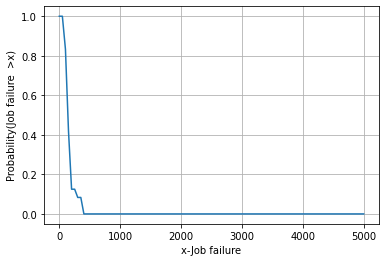

In [ ]:
plt.figure()
plt.plot(absc2,ords2/24)
plt.xlabel("x-Job failure")
plt.ylabel("Probability(Job failure  >x)")
plt.grid()


# Treatment(ML)

---
## 1st: Failure Prediction


In [ ]:
from sklearn.linear_model import LogisticRegression,Perceptron,BayesianRidge,SGDRegressor,ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,roc_curve, auc
import seaborn as sn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import StackingClassifier

begint=((600 + (0 * 86400))*1000000)
endt=((600 + (7 * 86400))*1000000)
endt2=((600 + (14 * 86400))*1000000) 
print(begint)
print(endt)
print(endt2)

600000000
605400000000
1210200000000


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
#@title Get google data
%%bigquery googlemltrain --project {project_id}

SELECT time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (time between 600000000 and 605400000000) and (type=6 or type=5)
ORDER BY RAND()
LIMIT 100000

In [ ]:
#@title Get google data
%%bigquery googlemltest --project {project_id}

SELECT time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (time between 605400000001 and 1210200000000) AND (type=6 or type=5)
ORDER BY RAND()
LIMIT 50000

In [ ]:
googlemltrain

,time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
0,299818278592,6,458432299445,2,115,0,3,1
1,547878908754,6,461061679224,2,115,0,3,1
2,303042758500,6,458448304314,0,200,0,1,0
3,510789088035,6,460633219881,1,103,0,1,1
4,596395397800,6,461463511775,2,25,0,2,0
...,...,...,...,...,...,...,...,...
99995,494325310038,6,460404868963,2,119,0,2,1
99996,400345674325,6,459483720583,1,115,0,3,1
99997,39825220641,6,455701962608,1,200,0,3,0
99998,22323438883,6,455610910436,1,119,0,3,0


In [ ]:
googlemltest

Prepare the data

In [ ]:
googlemltest.fillna(0)
googlemltrain.fillna(0)
googlemltrain['time']=googlemltrain['time']-600000000
googlemltest['time']=googlemltest['time']-605400000000
ytrain=googlemltrain["type"]
ytest=googlemltest["type"]
Xtrain=googlemltrain.drop(["type"],axis=1).drop(["time"],axis=1)
Xtest=googlemltest.drop(["type"],axis=1).drop(["time"],axis=1)


scaler = StandardScaler()
scaler.fit(Xtrain)
Xscale=scaler.transform(Xtrain)
Xscalet=scaler.transform(Xtest)
clf = LogisticRegression(random_state=0,class_weight='balanced').fit(Xscale, ytrain)
y_pred=clf.predict(Xscalet)
yscore=clf.predict_proba(Xscalet)






In [ ]:
googlemltest['time']

0        299895154603
1           470282249
2         16715257947
3         78569384953
4        547691994441
             ...     
49995    168487123197
49996    490615824269
49997     95898451664
49998    568832601855
49999    118023200816
Name: time, Length: 50000, dtype: int64

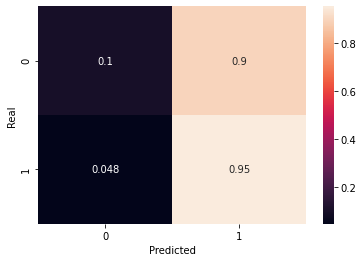

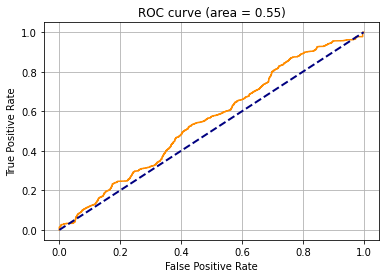

In [ ]:
conf=confusion_matrix(ytest, y_pred,normalize='true')
sn.heatmap(conf, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.show()


fpr, tpr, _ = roc_curve(ytest-5, yscore[:,1])
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange')
plt.grid()
plt.title('ROC curve (area = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')


In [ ]:
scaler = StandardScaler()
scaler.fit(Xtrain)
Xscale=scaler.transform(Xtrain)
Xscalet=scaler.transform(Xtest)

clf = Perceptron(class_weight='balanced').fit(Xscale, ytrain)
y_pred2=clf.predict(Xscalet)


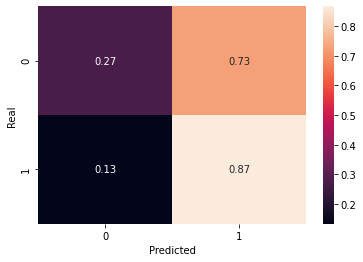

In [ ]:
conf=confusion_matrix(ytest, y_pred2,normalize='true')
sn.heatmap(conf, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.show()

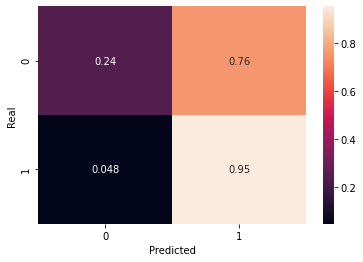

In [ ]:
y_con=[]
for elem1,elem2 in zip(y_pred,y_pred2):
  if elem1==elem2:
    if elem1==5:
      y_con.append(5)
    else:
      y_con.append(6)
  if elem1!=elem2:
      y_con.append(5)


conf=confusion_matrix(ytest, y_con,normalize='true')
sn.heatmap(conf, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.show()

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier


clf = BaggingClassifier(KNeighborsClassifier(),max_samples=0.5, max_features=0.5)
clf.fit(Xscale, ytrain)
y_pred2=clf.predict(Xscalet)
yscore=clf.predict_proba(Xscalet)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

clf=RandomForestClassifier(n_estimators=20)
clf.fit(Xscale, ytrain)
y_pred2=clf.predict(Xscalet)
yscore=clf.predict_proba(Xscalet)

NameError: ignored

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVC
estimators = [('rf', RandomForestClassifier(n_estimators=100, random_state=42)), ('svr', make_pipeline(StandardScaler(), LinearSVC(random_state=42)))]
clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
clf.fit(Xtrain, ytrain)
y_pred2=clf.predict(Xtest)
yscore=clf.predict_proba(Xtest)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
clf = GradientBoostingClassifier(random_state=0)
clf.fit(Xscale, ytrain)

y_pred2=clf.predict(Xscalet)
yscore=clf.predict_proba(Xscalet)

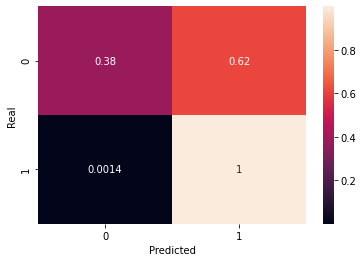

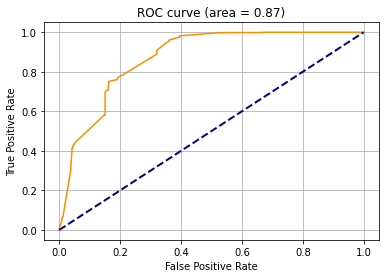

In [ ]:
conf=confusion_matrix(ytest, y_pred2,normalize='true')
sn.heatmap(conf, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.show()




fpr, tpr, _ = roc_curve(ytest-5, yscore[:,1])
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange')
plt.grid()
plt.title('ROC curve (area = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

## Consumption prediction

Get google data

In [ ]:
#@title Get google data
%%bigquery googlemltest2 --project {project_id}



SELECT start_time,average_usage,collection_id,collection_type,machine_id,random_sample_usage,assigned_memory
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
WHERE collection_id IN (SELECT DISTINCT collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
LIMIT 150 )
LIMIT 300000

In [ ]:
googlemltest2

,start_time,average_usage,collection_id,collection_type,machine_id,random_sample_usage,assigned_memory
0,2634900000000,"{'cpus': 0.0004787445068359375, 'memory': 0.00...",503872227487,0,17354445257,"{'cpus': 0.0001678466796875, 'memory': None}",0.001143
1,2634953000000,"{'cpus': 0.0002193450927734375, 'memory': 0.00...",503872227487,0,17354445257,"{'cpus': 0.000240325927734375, 'memory': None}",0.001143
2,2634954000000,"{'cpus': 5.626678466796875e-05, 'memory': 0.00...",503872227487,0,17354445257,"{'cpus': 0.0002689361572265625, 'memory': None}",0.001143
3,2634887000000,"{'cpus': 0.001445770263671875, 'memory': 0.000...",503872227487,0,17354445257,"{'cpus': 0.0012187957763671875, 'memory': None}",0.001143
4,2594700000000,"{'cpus': 0.00026416778564453125, 'memory': 0.0...",500631084296,0,91074335,"{'cpus': 0.00023746490478515625, 'memory': None}",0.000000
...,...,...,...,...,...,...,...
18423,1886609000000,"{'cpus': 0.0, 'memory': 9.5367431640625e-07}",497462788982,0,38988078390,"{'cpus': 0.0, 'memory': None}",0.002613
18424,1159077000000,"{'cpus': 0.0, 'memory': 9.5367431640625e-07}",480735587884,0,37222193367,"{'cpus': 0.0, 'memory': None}",0.001934
18425,1816080000000,"{'cpus': 0.0, 'memory': 1.1444091796875e-05}",497085094035,0,34850607742,"{'cpus': 0.0, 'memory': None}",0.002613
18426,1159113000000,"{'cpus': 8.96453857421875e-05, 'memory': 9.155...",480735587884,0,211278902057,"{'cpus': 5.435943603515625e-05, 'memory': None}",0.001934


In [ ]:

  

table=googlemltest2["average_usage"]
table2=googlemltest2["random_sample_usage"]
cpul=[]
meml=[]
cpulrd=[]
memlrd=[]

for elem in table:
  cpul.append(elem['cpus'])
  meml.append(elem['memory'])

for elem in table2:
  cpulrd.append(elem['cpus'])

googlemltest2['cpus']=cpul
googlemltest2['memory']=meml
googlemltest2['cpusrd']=cpulrd




# table1=googlemltest2[['start_time','collection_id','collection_type','machine_id','assigned_memory','cpusrd']]
X=googlemltest2[['collection_id','collection_type','machine_id','assigned_memory','cpusrd']]
# y=googlemltest2[['cpus','memory']]
y=googlemltest2[['cpus']]



Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=.9,
                                                    random_state=0,  shuffle=False)


clf = ElasticNet(random_state=0,l1_ratio=0)
regr.fit(Xtrain, ytrain)
ypred=clf.predict(Xtest)
yscore=clf.score(Xtest,ytest)
mae=sum(abs(ypred-ytest))/ytest.size
mape=sum(abs(ypred-ytest)/ytest)*100/ytest.size
print('mae=',mae)
print('mape=',mape)

NameError: ignored

In [ ]:
scaler = StandardScaler()
scaler.fit(Xtrain)
Xscale=scaler.transform(Xtrain)
Xscalet=scaler.transform(Xtest)


clf = ElasticNet(random_state=0).fit(Xscale, yscale.ravel())
ypred=clf.predict(Xscalet)
yscore=clf.score(Xscalet,yscalet)
yscore

0.37408691082553824

(-1000.0, 300.0)

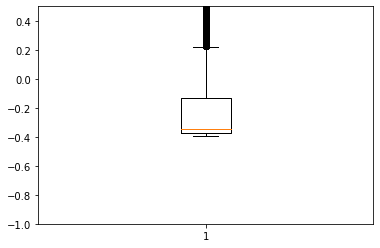

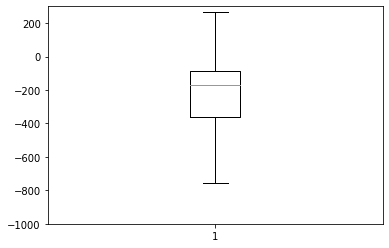

In [ ]:
plt.boxplot(yscalet)
plt.ylim([-1,0.5])
plt.figure()

plt.boxplot(ypred)
plt.ylim([-1000,300])



# Moving average method

---



In [ ]:
#@title Get google data
%%bigquery googlema1 --project {project_id}



SELECT start_time,average_usage,collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
WHERE collection_id IN (SELECT DISTINCT collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
LIMIT 150 )
LIMIT 300000

In [ ]:
googlema1

,start_time,average_usage,collection_id,cpus,memory
0,1859639000000,"{'cpus': 2.384185791015625e-05, 'memory': 8.58...",497311823573,0.000024,0.000009
1,1859640000000,"{'cpus': 0.00016880035400390625, 'memory': 8.5...",497311823573,0.000169,0.000009
2,1859635000000,"{'cpus': 0.0008249282836914062, 'memory': 3.05...",497311823573,0.000825,0.000031
3,1662040000000,"{'cpus': 9.1552734375e-05, 'memory': 0.0008602...",496237293352,0.000092,0.000860
4,1662033000000,"{'cpus': 0.0008058547973632812, 'memory': 0.00...",496237293352,0.000806,0.001833
...,...,...,...,...,...
272202,1487205000000,"{'cpus': 0.001186370849609375, 'memory': 4.100...",495042842641,0.001186,0.000041
272203,1487205000000,"{'cpus': 0.0, 'memory': 0.00252532958984375}",495042842641,0.000000,0.002525
272204,1487205000000,"{'cpus': 0.00495147705078125, 'memory': 0.0022...",495042842641,0.004951,0.002235
272205,1487205000000,"{'cpus': 0.001186370849609375, 'memory': 0.002...",495042842641,0.001186,0.002056


In [ ]:
table=googlema1["average_usage"]
cpul=[]
meml=[]


for elem in table:
  cpul.append(elem['cpus'])
  meml.append(elem['memory'])


googlema1['cpus']=cpul
googlema1['memory']=meml

table=googlema1.copy(deep=True)
table=table[['start_time','collection_id','cpus','memory']]

filter = table["collection_id"]==table["collection_id"][80000]
  
# filtering data 
table.where(filter, inplace = True)


table=table.dropna()
table=table.sort_values(by=['start_time']) 

rolling_mean = table['cpus'].rolling(window=5).mean()
rolling_mean2 = table['cpus'].rolling(window=10).mean()
rolling_mean3 = table['cpus'].rolling(window=20).mean()
rolling_mean4 = table['cpus'].rolling(window=30).mean()

exp1 = table['cpus'].ewm(span=5, adjust=False).mean()
exp2 = table['cpus'].ewm(span=10, adjust=False).mean()
exp3 = table['cpus'].ewm(span=20, adjust=False).mean()
exp4 = table['cpus'].ewm(span=30, adjust=False).mean()


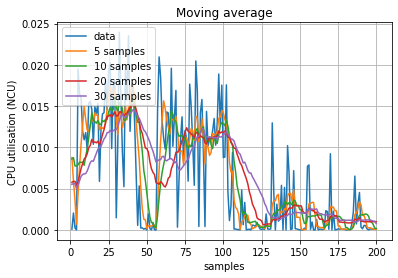

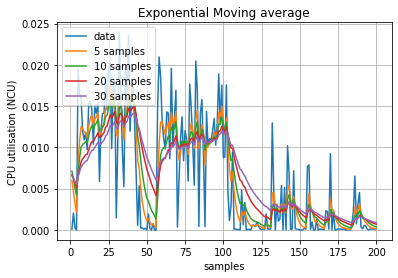

In [ ]:
plt.plot(np.linspace(1,200,200), table['cpus'][400:600], label='data')
plt.plot(np.linspace(1,200,200), rolling_mean[400:600], label='5 samples')
plt.plot(np.linspace(1,200,200), rolling_mean2[400:600], label='10 samples')
plt.plot(np.linspace(1,200,200), rolling_mean3[400:600], label='20 samples')
plt.plot( np.linspace(1,200,200),rolling_mean4[400:600], label='30 samples')
plt.legend(loc='upper left')
plt.xlabel('samples')
plt.ylabel('CPU utilisation (NCU)')
plt.title('Moving average')
plt.grid()

plt.show()


plt.plot(np.linspace(1,200,200), table['cpus'][400:600], label='data')
plt.plot(np.linspace(1,200,200),exp1[400:600], label='5 samples')
plt.plot(np.linspace(1,200,200), exp2[400:600], label='10 samples')
plt.plot(np.linspace(1,200,200),exp3[400:600], label='20 samples')
plt.plot(np.linspace(1,200,200), exp4[400:600], label='30 samples')
plt.legend(loc='upper left')
plt.xlabel('samples')
plt.ylabel('CPU utilisation (NCU)')
plt.title('Exponential Moving average')
plt.grid()

plt.show()

In [ ]:
from statsmodels.tsa.stattools import pacf
import math


 
def create_lag_features(y):
   

    features = pd.DataFrame()
    
    partial = pd.Series(data=pacf(y, nlags=5))
    lags = list(partial[np.abs(partial) >=0.2].index)
    print("numbers of 5%=",1.96/math.sqrt(y.size))
    df = pd.DataFrame()
    
    # avoid to insert the time series itself
    lags.remove(0)
    
    for l in lags:
        df[f"lag_{l}"] = y.shift(l)
    
    features = pd.DataFrame(df[df.columns],
                            columns=df.columns)
    features.index = y.index
    
    return features



lagf=create_lag_features(table['cpus'])
toconcat=[table,lagf]
table=pd.concat(toconcat,axis=1).dropna()

y=table['cpus']
X=table.drop(['cpus'],axis=1)
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=.9,
                                                    random_state=0,  shuffle=False)


clf = ElasticNet(random_state=0,l1_ratio=0,max_iter=5000)
clf.fit(Xtrain, ytrain)
ypred=clf.predict(Xtest)
yscore=clf.score(Xtest,ytest)
mae=sum(abs(ypred-ytest))/ytest.size
mape=sum(abs(ypred-ytest)/ytest)*100/ytest.size
print('mae=',mae)
print('mape=',mape)

ypred

numbers of 5%= 0.0036073565322687086
mae= 0.00936171148603117
mape= inf


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4730062896004028, tolerance: 0.00029492501496770093



array([0.01259694, 0.01259694, 0.01259695, ..., 0.02922347, 0.02922348,
       0.02922352])

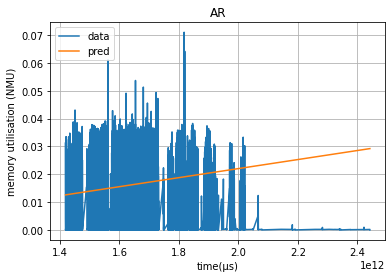

In [ ]:
plt.plot(Xtest['start_time'], ytest, label='data')
plt.plot(Xtest['start_time'], ypred, label='pred')
plt.legend(loc='upper left')
plt.xlabel('time(µs)')
plt.ylabel('memory utilisation (NMU)')
plt.title('AR')
plt.grid()



In [ ]:
!pip install statsmodels

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dis

Test MSE:f 8.926808877181038e-08


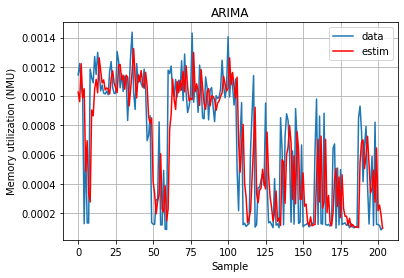

In [ ]:
from statsmodels.tsa.arima_model import ARIMA,ARMA
from sklearn.metrics import mean_squared_error


# create a differenced series
def difference(dataset, interval=1):
	diff = list()
	for i in range(interval, len(dataset)):
		value = dataset[i] - dataset[i - interval]
		diff.append(value)
	return numpy.array(diff)
 
X = table['memory'].values
abs=table['start_time']
X=X[0:600]
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
abstrain, abstest = abs[0:size], abs[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit(disp=0)
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
error = mean_squared_error(test, predictions)
print('Test MSE:f', error)
# plot
plt.plot(test)
plt.plot(predictions, color='red')
plt.title("ARIMA")
plt.xlabel("Sample")
plt.grid()

plt.ylabel("Memory utilization (NMU)")
plt.legend(['data','estim'])
plt.show()

Test MSE:f 6.687694555680915e-06


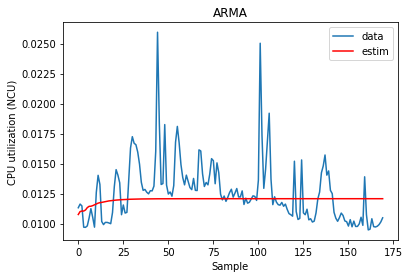

In [ ]:
 
X = table['cpus'].values
X=X[0:500]
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]

model = ARMA(train,(10,0)).fit(disp=False)
predictions=model.predict(start=350,end=499)
error = mean_squared_error(test, predictions)

print('Test MSE:f', error)
# plot
plt.plot(test)
plt.plot(predictions, color='red')
plt.title("ARMA")
plt.xlabel("Sample")
plt.ylabel("CPU utilization (NCU)")
plt.legend(['data','estim'])
plt.show()

# Task priority analysis

---



In [ ]:
#@title Get google data
%%bigquery googletr --project {project_id}

SELECT time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (type=3 or type=5) and (priority<200) and collection_id IN (SELECT DISTINCT collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
LIMIT 100000 )

FailedPrecondition: ignored

In [ ]:
googletr

,time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler,priol
0,774173055082,3,468968832690,0,114,0,2,1,mid
1,651039197778,3,461948552342,0,114,0,2,1,mid
2,552029863024,3,461080868285,0,114,0,2,1,mid
3,299761623106,3,458432242867,0,116,0,2,1,mid
4,567650187947,3,461150270172,0,107,0,2,1,mid
...,...,...,...,...,...,...,...,...,...
102134,464372709141,5,460267047982,1,200,0,3,0,beb
102135,2383676378017,5,499538911131,1,200,0,3,0,beb
102136,1867717709108,5,497375931421,1,200,0,3,0,beb
102137,1105244817953,5,479641526457,1,200,0,3,0,beb


In [ ]:
cntfr=0
cntm=0
cntp=0
cntb=0
priol=[]
tfr=[]
tm=[]
tp=[]
tb=[]
tfr2=[]
tm2=[]
tp2=[]
tb2=[]
tfr3=[]
tm3=[]
tp3=[]
tb3=[]

table=googletr["priority"]
for elem in table:
  if elem<100:
    priol.append("free")
    cntfr+=1
         
  elif elem<120:
    priol.append("mid")
    cntm+=1
  elif elem<200:
    priol.append("prod")
    cntp+=1
  else:
    priol.append("beb")
    cntb+=1

googletr["priol"]=priol

for intd,priol in googletr.iterrows():
  if priol['priority']<100:
    if (priol["collection_id"] in tfr):
      tfr3.append(priol["time"]-tfr2[tfr.index(priol["collection_id"])])
    else:
      tfr.append(priol["collection_id"])
      tfr2.append(priol["time"])
  elif priol['priority']<120:
    if (priol["collection_id"] in tm):
      tm3.append(priol["time"]-tm2[tm.index(priol["collection_id"])])
    else:
      tm.append(priol["collection_id"])
      tm2.append(priol["time"])
  elif priol['priority']<200:
    if (priol["collection_id"] in tp):
      tp3.append(priol["time"]-tp2[tfr.index(priol["collection_id"])])
    else:
      tp.append(priol["collection_id"])
      tp2.append(priol["time"])
  else:
    if (priol["collection_id"] in tfr):
      tb3.append(priol["time"]-tb2[tfr.index(priol["collection_id"])])
    else:
      tb.append(priol["collection_id"])
      tb2.append(priol["time"])
print(np.mean(tfr3)/1000)
print(np.mean(tm3)/1000)
print(np.mean(tp3)/1000)
print(np.mean(tb3)/1000)

517472.52975
17456620.915211573
nan
nan


/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning:

invalid value encountered in double_scalars



In [ ]:
#@title Get google data
%%bigquery googletr2 --project {project_id}

SELECT time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (type=3) 
ORDER BY time ASC
LIMIT 150000

In [ ]:
googletr2

,time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
0,0,3,28522069371,3,450,1,1,0
1,0,3,49340059198,1,200,0,3,0
2,0,3,423308986796,0,103,0,2,1
3,0,3,384280101711,3,200,0,3,0
4,0,3,329592492838,1,119,0,1,0
...,...,...,...,...,...,...,...,...
79995,105477103183,3,456092112019,2,200,0,3,0
79996,105479300446,3,456092116567,0,200,0,1,0
79997,105480425869,3,456092116828,3,200,0,2,0
79998,105488267249,3,456092119264,1,200,0,3,0


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from statsmodels.tsa.stattools import pacf
import math

 
def create_lag_features(y):
   

    features = pd.DataFrame()
    
    partial = pd.Series(data=pacf(y, nlags=10))
    lags = list(partial[np.abs(partial) >=0.2].index)
    print("numbers of 5%=",1.96/math.sqrt(y.size))
    df = pd.DataFrame()
    
    # avoid to insert the time series itself
    lags.remove(0)
    
    for l in lags:
        df[f"lag_{l}"] = y.shift(l)
    
    features = pd.DataFrame(df[df.columns],
                            columns=df.columns)
    features.index = y.index
    
    return features

cntfr=0
cntm=0
cntb=0
cntp=0
priol=[]
table=googletr2["priority"]
for elem in table:
  if elem<100:
    priol.append(1)
    cntfr+=1     
  elif elem<120:
    priol.append(2)
    cntm+=1
  elif elem<200:
    priol.append(3)
    cntp+=1
  else:
    priol.append(4)
    cntb+=1
  
print(cntfr/(cntfr+cntm+cntp+cntb))
print(cntm/(cntfr+cntm+cntp+cntb))
print(cntp/(cntfr+cntm+cntp+cntb))
print(cntb/(cntfr+cntm+cntp+cntb))
googletr2["priol"]=priol



lagf=create_lag_features(googletr2['priol'])
toconcat=[googletr2,lagf]
table=pd.concat(toconcat,axis=1).dropna()

y=table['priol']
X=table.drop(['priol'],axis=1).drop(['priority'],axis=1).drop(['scheduling_class'],axis=1).drop(['vertical_scaling'],axis=1).drop(['scheduler'],axis=1).drop(['type'],axis=1)
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=.2,
                                                    random_state=0,  shuffle=False)


scaler = StandardScaler()
scaler.fit(Xtrain)
Xscale=scaler.transform(Xtrain)
Xscalet=scaler.transform(Xtest)


clf = GradientBoostingClassifier()
clf.fit(Xscale, ytrain)

y_pred2=clf.predict(Xscalet)
yscore=clf.predict_proba(Xscalet)

0.17213333333333333
0.5447533333333333
0.00078
0.2823333333333333
numbers of 5%= 0.005060698239044358


KeyError: ignored

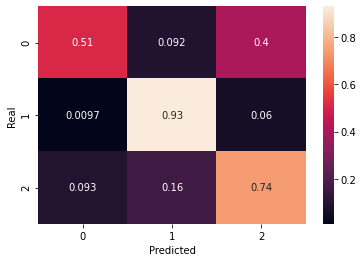

In [ ]:
conf=confusion_matrix(ytest, y_pred2,normalize='true')
sn.heatmap(conf, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Real')
plt.show()





In [ ]:
#@title Get google data
%%bigquery googlecons1 --project {project_id}

SELECT time,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (type=3) and (priority<200)
ORDER BY collection_id  DESC
LIMIT 150

FailedPrecondition: ignored

In [ ]:
googlecons1

,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler
0,3,504387793351,1,118,0,2,1
1,3,504387787359,2,118,0,2,1
2,3,504387781931,1,0,0,2,0
3,3,504386780343,1,103,0,1,1
4,3,504386780242,1,103,0,1,1
...,...,...,...,...,...,...,...
145,3,504383421180,1,119,0,2,0
146,3,504383421177,0,103,0,3,1
147,3,504383421175,2,115,0,3,1
148,3,504383418812,0,103,0,3,1


In [ ]:
#@title Get google data
%%bigquery googlecons2 --project {project_id}

SELECT start_time,average_usage,collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.instance_usage`
WHERE collection_id IN ( SELECT collection_id
FROM `google.com:google-cluster-data.clusterdata_2019_b.collection_events`
WHERE (type=3) and (priority<200)
ORDER BY collection_id DESC
LIMIT 150 )
LIMIT 500000

In [ ]:
googlecons2

,average_usage,collection_id
0,"{'cpus': 0.0008306503295898438, 'memory': 0.00...",504383568679
1,"{'cpus': 0.0009126663208007812, 'memory': 0.00...",504383568679
2,"{'cpus': 0.0022735595703125, 'memory': 0.00056...",504386780343
3,"{'cpus': 0.00213623046875, 'memory': 0.0005655...",504386780343
4,"{'cpus': 0.00222015380859375, 'memory': 0.0004...",504386780343
...,...,...
26162,"{'cpus': 0.0007038116455078125, 'memory': 0.00...",504383426850
26163,"{'cpus': 0.0001678466796875, 'memory': 0.00015...",504383426850
26164,"{'cpus': 0.0, 'memory': 0.0001583099365234375}",504383426850
26165,"{'cpus': 0.0, 'memory': 9.5367431640625e-07}",504383426850


In [ ]:

cntfr=0
cntm=0
priol=[]

table=googlecons1["priority"]
for elem in table:
  if elem<100:
    priol.append(1)    
  elif elem<120:
    priol.append(2)
  else :
    priol.append(0)
googlecons1["priol"]=priol
googlecons1=googlecons1.dropna()

table=googlecons2["average_usage"]
cpul=[]
meml=[]


for elem in table:
  cpul.append(elem['cpus'])
  meml.append(elem['memory'])


googlecons2['cpus']=cpul
googlecons2['memory']=meml
table=googlecons2.drop(['average_usage'],axis=1)
table=table.groupby(['collection_id']).sum()

table=table.sort_values(by=['collection_id'])

googlecons1=googlecons1.sort_values(by=['collection_id'])
googlecons1
googlecons1['cpus']=table['cpus'].values
googlecons1['memory']=table['memory'].values
googlecons1
# for elem1,elem2 in zip(googlecons1,googlecons2):
#   elem=[elem1]
table=googlecons1.groupby(['priol']).mean()
table

#mean: 
#

,type,collection_id,scheduling_class,priority,collection_type,vertical_scaling,scheduler,cpus,memory
priol,,,,,,,,,
1,3.0,5.043839e+11,1.272727,14.204545,0.000000,1.863636,0.000000,0.039113,0.018940
2,3.0,5.043843e+11,1.028302,110.886792,0.018868,2.245283,0.867925,0.592687,0.421151


In [ ]:
googlecons2

,average_usage,collection_id,cpus,memory
0,"{'cpus': 0.0008306503295898438, 'memory': 0.00...",504383568679,0.000831,5.111694e-04
1,"{'cpus': 0.0009126663208007812, 'memory': 0.00...",504383568679,0.000913,6.713867e-04
2,"{'cpus': 0.0022735595703125, 'memory': 0.00056...",504386780343,0.002274,5.674362e-04
3,"{'cpus': 0.00213623046875, 'memory': 0.0005655...",504386780343,0.002136,5.655289e-04
4,"{'cpus': 0.00222015380859375, 'memory': 0.0004...",504386780343,0.002220,4.196167e-04
...,...,...,...,...
26162,"{'cpus': 0.0007038116455078125, 'memory': 0.00...",504383426850,0.000704,3.833771e-04
26163,"{'cpus': 0.0001678466796875, 'memory': 0.00015...",504383426850,0.000168,1.592636e-04
26164,"{'cpus': 0.0, 'memory': 0.0001583099365234375}",504383426850,0.000000,1.583099e-04
26165,"{'cpus': 0.0, 'memory': 9.5367431640625e-07}",504383426850,0.000000,9.536743e-07
